# Práctica 2: Análisis exploratorio en un problema de clasificación

## Introducción

Esta práctica consiste en llevar a cabo un proceso de análisis exploratorio de datos. A continuación se introducen los prerequisitos y el contexto de la tarea.

### Utilizaremos en esta práctica las siguientes librerías:

[numpy](http://www.numpy.org/) permite manipular matrices de modo sencillo e incorpora funciones de cálculo útiles.

[pandas](http://pandas.pydata.org/) proporciona estructuras de datos fáciles de usar y funciones de acceso a datos desde múltiples fuentes y formatos.

[matplotlib](matplotlib.org) permite generar múltiples tipos de gráficos.

[re](https://docs.python.org/2/library/re.html#) permite manipular expresiones regulares.

In [192]:
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

In [193]:
import brewer2mpl
from matplotlib import rcParams

#colorbrewer2 Dark2 qualitative color table
dark2_cmap = brewer2mpl.get_map('Dark2', 'Qualitative', 7)
dark2_colors = dark2_cmap.mpl_colors

rcParams['figure.figsize'] = (10, 6)
rcParams['figure.dpi'] = 150
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['font.size'] = 14
rcParams['patch.edgecolor'] = 'white'
rcParams['patch.facecolor'] = dark2_colors[0]
rcParams['font.family'] = 'StixGeneral'


# Para eliminar bordes en gráficas

def elimina_borde(axes=None, top=False, right=False, left=True, bottom=True):
    ax = axes or plt.gca()
    ax.spines['top'].set_visible(top)
    ax.spines['right'].set_visible(right)
    ax.spines['left'].set_visible(left)
    ax.spines['bottom'].set_visible(bottom)
    
    # Eliminar marcas
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')
    
    # Rehabilitar visibles
    if top:
        ax.xaxis.tick_top()
    if bottom:
        ax.xaxis.tick_bottom()
    if left:
        ax.yaxis.tick_left()
    if right:
        ax.yaxis.tick_right()

In [194]:
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)

## Clasificación de aceites de oliva italianos

El punto de partida es una colección de datos extraídos de un conjunto de diferentes aceites de oliva. Cada muestra de aceite se representa mediante ocho parámetros, que se corresponden con los niveles de distintos ácidos grasos que están presentes en cada aceite. Cada muestra de aceite pertenece a una de entre nueve variedades de aceite de oliva, de tres regiones y ocho áreas geográficas distintas de Italia.

El objetivo del análisis es desarrollar un conjunto de reglas de clasificación que permitan distinguir de modo fiable los nueve aceites. Este es un problema de interés práctico, porque el aceite de algunas de las zonas está muy bien valorado, y existe cierto nivel de fraude en la denominación de origen. Además, el contenido en ácidos grasos varía con el clima, lo que resulta relevante para decidir qué variedades se han de plantar en según qué zonas.

**Fuente:**

> Forina, M., Armanino, C., Lanteri, S. & Tiscornia, E. (1983). Classification of Olive Oils from their Fatty Acid Composition, in Martens, H. and Russwurm Jr., H., eds., Food Research and Data Analysis, Applied Science Publishers, London, pp. 189–214.

Número de muestras: 572

Número de variables: 10

*Descripción:* Los datos representan el porcentaje (x100) de ácidos grasos en la fracción lipídica de un conjunto de muestras de aceites de oliva procedentes de Italia. Los datos proceden de un estudio cuyo objetivo es la determinación de la autenticidad de la denominación de origen en el aceite de oliva.

![Mapa de regiones de procedencia](ficheros/Italy.png)

## 1. Cargamos y limpiamos los datos

Cargamos los datos desde el fichero `oliva.csv` mediante la librería pandas y visualizamos las 5 primeras filas de datos. Como el fichero está en formato CSV debemos usar una función de pandas que nos permita trabajar con este formato.

In [195]:
# Almacenamos los datos del fichero en el objeto 'datos', de tipo Dataframe
data: pd.DataFrame = pd.read_csv("ficheros\oliva.csv")
data.head()

<>:2: SyntaxWarning: invalid escape sequence '\o'
<>:2: SyntaxWarning: invalid escape sequence '\o'
C:\Users\jl.serradilla.umu\AppData\Local\Temp\ipykernel_18512\2890236446.py:2: SyntaxWarning: invalid escape sequence '\o'
  data: pd.DataFrame = pd.read_csv("ficheros\oliva.csv")


,Unnamed: 0,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,1.Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,2.Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,3.Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,4.Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,5.Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46


Nótese que la primera columna carece de nombre. Para asignarle uno, podemos usar la función de pandas llamada `rename()`.

In [196]:
# Imprimimos en primer lugar los títulos de las columnas, que se encuentran en datos.columns
print(data.columns)

# Cambiamos columns[0] por 'procedencia'
old_name = data.columns[0]
data: pd.DataFrame = data.rename(columns={old_name: "procedencia"})
print(data.columns)


Index(['Unnamed: 0', 'región', 'área', 'palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico'], dtype='object')
Index(['procedencia', 'región', 'área', 'palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico'], dtype='object')


Queremos acceder a la subtabla formada por las columnas `oleico` y `linoleico`.

In [197]:
columns = ["oleico", "linoleico"]
subtable = data[columns]
subtable

,oleico,linoleico
0,7823,672
1,7709,781
2,8113,549
3,7952,619
4,7771,672
...,...,...
567,7490,790
568,7740,810
569,7720,970
570,7750,870


El resultado es un nuevo objeto, del tipo `DataFrame` de pandas. Queremos ahora acceder a una sola de las columnas, por ejemplo, la del ácido esteárico.

In [198]:
column = "esteárico"
subtable = data[column]
print(subtable)

0      226
1      224
2      246
3      240
4      259
      ... 
567    290
568    270
569    210
570    250
571    240
Name: esteárico, Length: 572, dtype: int64


El objeto obtenido es un objeto del tipo `Series` de pandas. Si utilizamos dos corchetes para indexar a partir de una lista obtendremos un objeto de tipo `DataFrame`. Analizaremos los tipos de ambos ejemplos mediante la función `type()`.

In [199]:
print ("tipo de datos[['esteárico']]:\t", type(data[['esteárico']]))
print ("tipo de datos['esteárico']:\t", type(data['esteárico']))

tipo de datos[['esteárico']]:	 <class 'pandas.core.frame.DataFrame'>
tipo de datos['esteárico']:	 <class 'pandas.core.series.Series'>


Volvemos a nuestra tabla de datos y eliminamos el número que acompaña a cada región de procedencia, ya que se extrajo del fichero junto con el nombre porque ambos aparecen separados por un punto. Para ello podemos utilizar tanto la función `split()` como la función `sub()` de la librería `re` de expresiones regulares, junto con la función `map()` para realizar el cambio con cada uno de los elementos de la columna de procedencia.

In [200]:
# Actualizamos la columna 'procedencia' con una expresión del tipo: datos['procedencia'].map()
procedencia = data["procedencia"]
deleter = lambda text: re.sub(r"^(.*?)\.", "", text)
data["procedencia"] = procedencia.map(deleter)
data

,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46
...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,1280,110,290,7490,790,10,10,2
568,Liguria-Ovest,3,8,1060,100,270,7740,810,10,10,3
569,Liguria-Ovest,3,8,1010,90,210,7720,970,0,0,2
570,Liguria-Ovest,3,8,990,120,250,7750,870,10,10,2


Resulta un poco confusa la existencia de una columna `región` y otra `área`, además de la que indica la procedencia. Consultaremos qué valores distintos hay en ambas columnas. En este caso es sencillo porque el conjunto de datos no es muy extenso, pero utilizaremos la función `unique()` para hacer este análisis extensivo a cualquier conjunto de datos verdaderamente grande.

In [201]:
print(pd.unique(data["región"]))
print(pd.unique(data["área"]))

[1 2 3]
[1 2 3 4 5 6 9 7 8]


Necesitamos saber cuántas zonas únicas hay en el conjunto de datos, ya que a ellas asignaremos cada etiqueta de clase. Para ello podemos realizar una tabla de contingencia entre las etiquetas de regiones y las etiquetas de áreas. En Python podemos hacer esto mediante la función `crosstab()`.

In [202]:
pd.crosstab(data.región, data.área)

área,1,2,3,4,5,6,7,8,9
región,,,,,,,,,
1,25,56,206,36,0,0,0,0,0
2,0,0,0,0,65,33,0,0,0
3,0,0,0,0,0,0,50,50,51


Generamos el conjunto de valores diferentes de la columna procedencia mediante la función `unique()`

In [203]:
pd.unique(data.procedencia)

array(['Puglia-Nord', 'Calabria', 'Puglia-Sud', 'Sicilia',
       'Sardinia-Interno', 'Sardinia-Costa', 'Umbria', 'Liguria-Est',
       'Liguria-Ovest'], dtype=object)

Recuperaremos los valores originales (en tanto por ciento) de la proporción de cada ácido graso en cada muestra de aceite, porque después su representación gráfica será más fácilmente comprensible. Para ello actuamos sobre las columnas que representan las proporciones de los ácidos grasos. Podemos utilizar la función `apply()` para dividir todos los valores entre 100.

In [204]:
# Definimos una lista con los nombres de los distintos ácidos grasos
fatty_acid = data.columns[3:]

# Accedemos a cada uno de los valores de cada una de las columnas y lo dividimos entre 100 mediante apply()
divider = lambda x: x/100
data[fatty_acid] = data[fatty_acid].apply(divider)
data


,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46
...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,12.80,1.10,2.90,74.90,7.90,0.10,0.10,0.02
568,Liguria-Ovest,3,8,10.60,1.00,2.70,77.40,8.10,0.10,0.10,0.03
569,Liguria-Ovest,3,8,10.10,0.90,2.10,77.20,9.70,0.00,0.00,0.02
570,Liguria-Ovest,3,8,9.90,1.20,2.50,77.50,8.70,0.10,0.10,0.02


Podemos comprobar que la composición de ácidos grasos es consistente, es decir, que la suma de las proporciones de los ácidos grasos para cada muestra se mantiene próximo al 100%.

In [205]:
described_data = data.iloc[:,3:]
described_data.sum(axis=1).describe()

count    572.000000
mean      99.852448
std        0.268201
min       98.110000
25%       99.700000
50%       99.960000
75%      100.010000
max      101.020000
dtype: float64

Representamos mediante gráficos de dispersión los datos correspondientes a la presencia de ácido palmítico y ácido palmitoleico en el total de las muestras. Las librerías pyplot utilizan la noción de figura actual y ejes actuales. Para realizar esta figura podemos hacer uso de la función `scatter()`. También podemos utilizar las funciones `set_title()`, `set_xlabel()` y `set_ylabel()` para añadir rótulos a la figura a partir del objeto que representa los ejes, que podemos extraer mediante la función `gca()`.

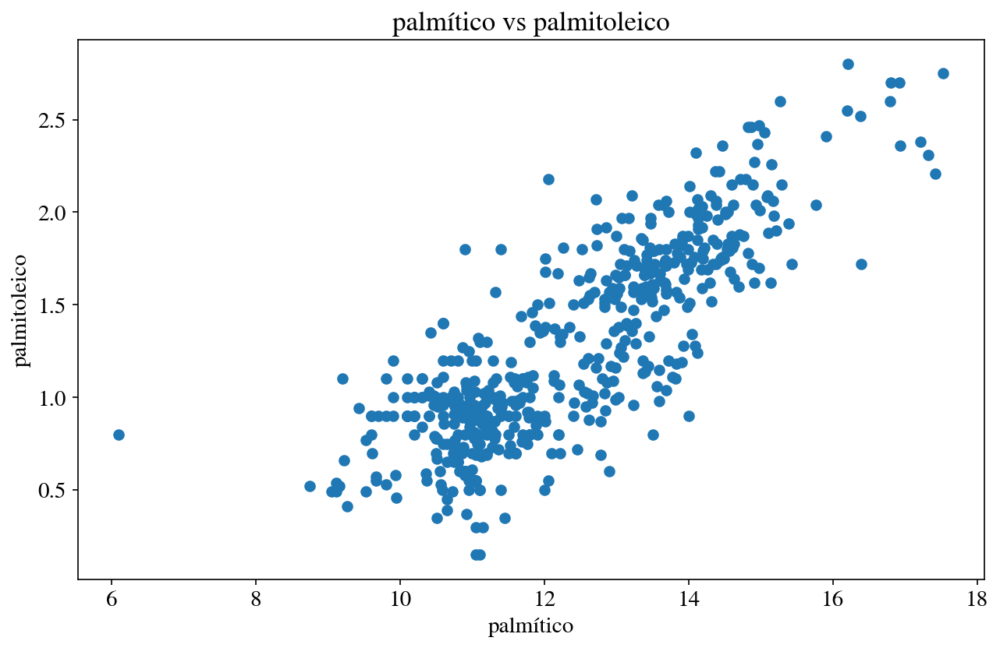

In [206]:
# Definimos la figura actual
fig = plt.figure()

# Definimos los ejes actuales
axis = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
axis.set_title('palmítico vs palmitoleico')
axis.set_xlabel('palmítico')
axis.set_ylabel('palmitoleico')
axis.scatter(data.palmítico, data.palmitoleico)

Representamos gráficamente el histograma de la presencia de ácido palmitoleico en el conjunto de muestras. Hacemos uso para ello de la función `hist()`.

<Axes: >

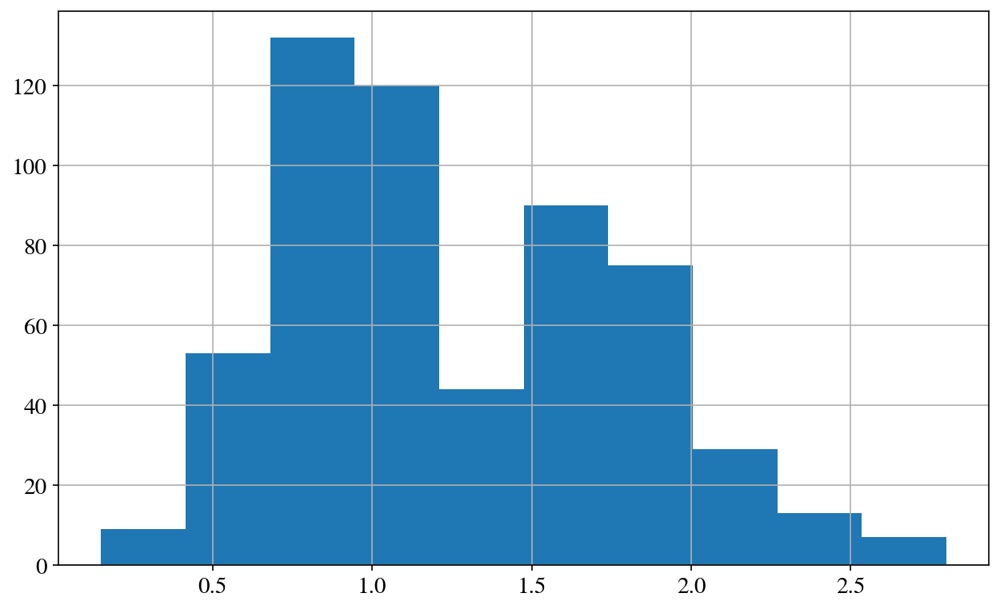

In [207]:
data.palmitoleico.hist()

Utilizaremos la función `subplots()` para representar cuatro figuras en una matriz de dos por dos.

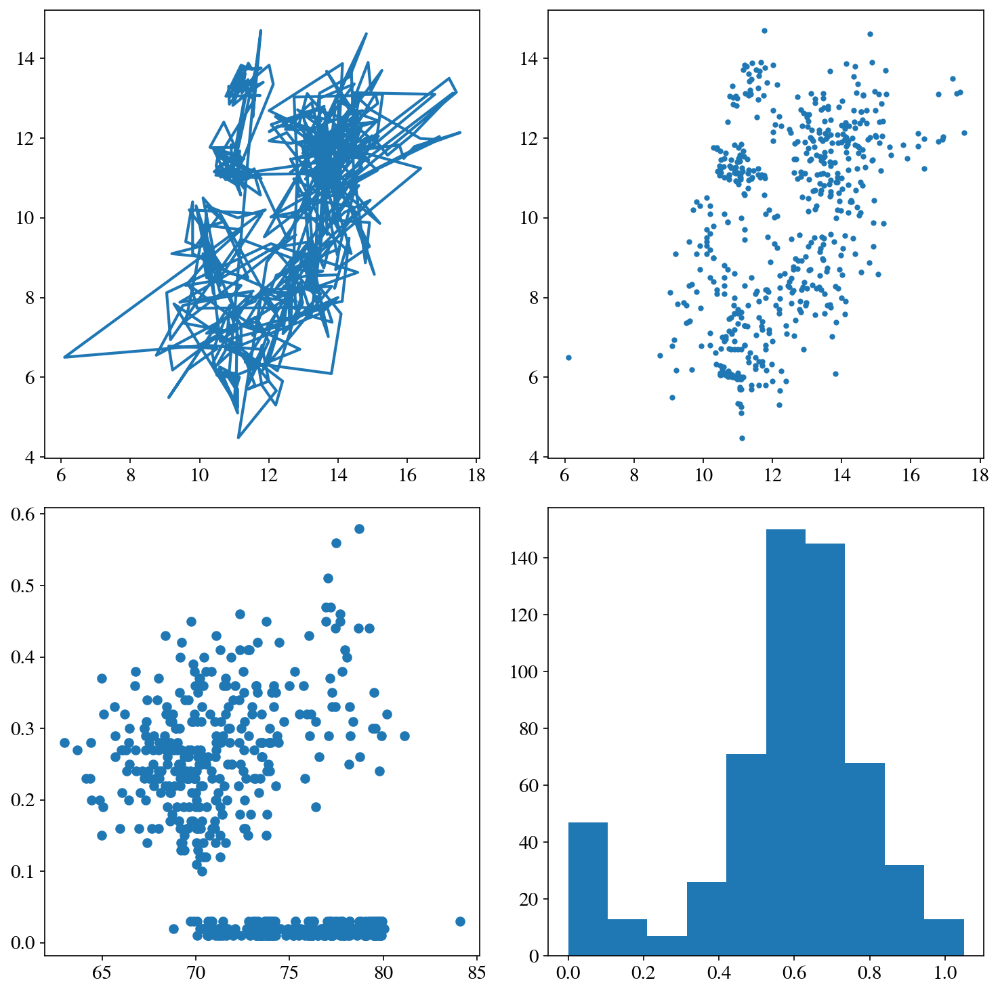

In [208]:
fig, axes = plt.subplots(figsize=(10, 10), nrows=2, ncols=2)
axes[0][0].plot(data['palmítico'], data['linoleico'])
axes[0][1].plot(data['palmítico'], data['linoleico'], '.')
axes[1][0].scatter(data['oleico'], data['eicosenoico'])
axes[1][1].hist(data['araquídico'])
fig.tight_layout()

Representaremos mediante gráficos de dispersión los ácidos grasos de la lista `acidos_y` frente a los de la lista `acidos_x`. Podemos dibujar los ácidos grasos de la lista `acidos_y` en el eje 'y' y los ácidos grasos de la lista `acidos_x` en el eje 'x'. La representación se hará mediante una matriz de figuras de 3 filas y 2 columnas. Etiquetar convenientemente cada figura. Para no contar el número de elementos en las listas, podemos utilizar la función `enumerate()`.

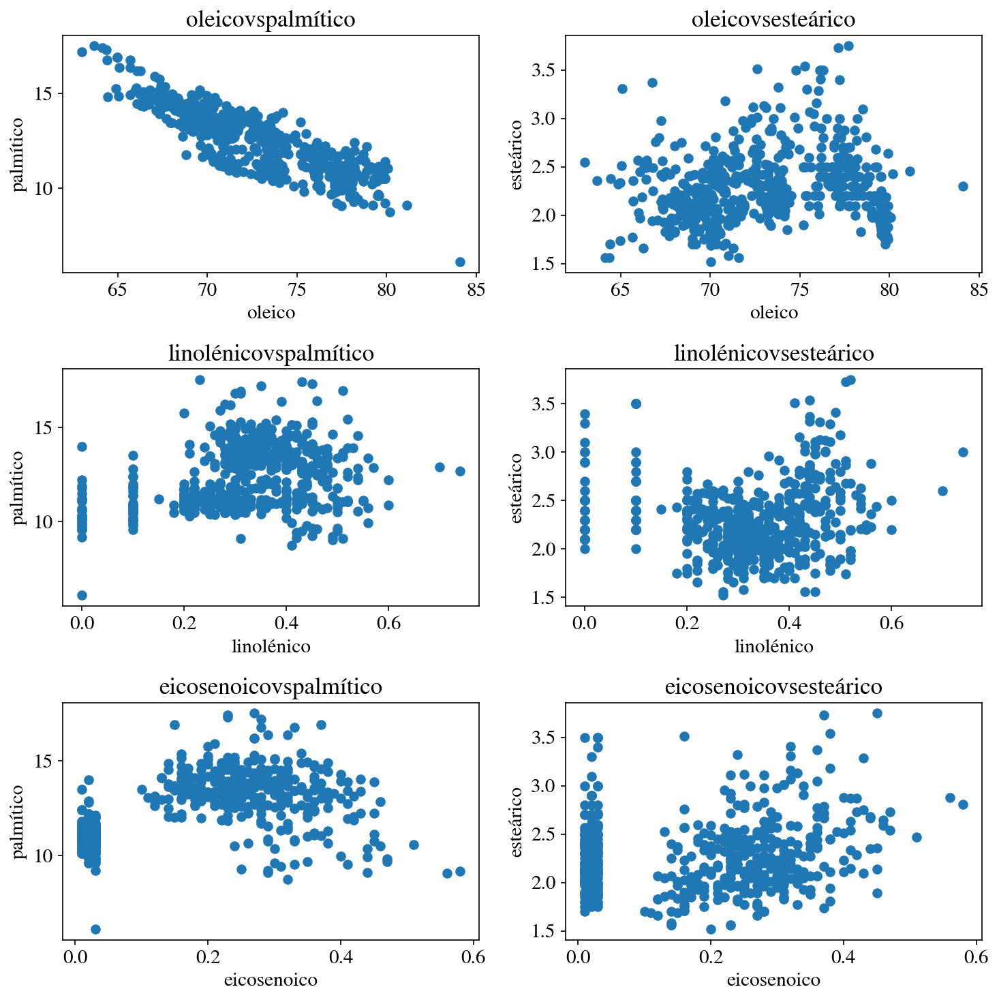

In [209]:
acidos_x = ['oleico', 'linolénico', 'eicosenoico']
acidos_y = ['palmítico', 'esteárico']

# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
fig, axes = plt.subplots(figsize=(10,10), nrows=3, ncols=2)
for idx_x, acid_x in enumerate(acidos_x):
    for idx_y, acid_y in enumerate(acidos_y):
        ax = axes[idx_x,idx_y]
        ax.scatter(data[acid_x], data[acid_y])
        ax.set_xlabel(acid_x)
        ax.set_ylabel(acid_y)
        ax.set_title(acid_x + "vs" + acid_y)        
fig.tight_layout()

Utilizaremos la función `groupby()` para realizar distintos agrupamientos de los valores de la tabla. En primer lugar, agruparemos por el valor la columna `región`, que nos permitirá dividir el conjunto de datos en tres subconjuntos.

In [210]:
grouped_data = data.groupby("región")
grouped_data.head()

,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46
323,Sardinia-Interno,2,5,11.29,1.20,2.22,72.72,11.12,0.43,0.98,0.02
324,Sardinia-Interno,2,5,10.42,1.35,2.10,73.76,11.16,0.35,0.90,0.03
325,Sardinia-Interno,2,5,11.03,0.96,2.10,73.80,10.85,0.32,0.94,0.03
326,Sardinia-Interno,2,5,11.18,0.97,2.21,72.79,11.54,0.35,0.94,0.02
327,Sardinia-Interno,2,5,10.52,0.95,2.15,73.88,11.26,0.31,0.92,0.01


La función `groupby()` proporciona un objeto de tipo diccionario, donde las claves son los valores que permiten el agrupamiento, y los grupos direccionados por las claves son los correspondientes subconjuntos de la matriz inicial. Podemos direccionar los tres subconjuntos correspondientes a las tres regiones iterando mediante un bucle.

In [211]:
dict_grouped_data = grouped_data.groups
for key in dict_grouped_data.keys():
    idx = dict_grouped_data[key]
    print(f"Región {key}:")
    print(data.iloc[idx,:])

Región 1:
     procedencia  región  área  palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico
0    Puglia-Nord       1     1      10.75          0.75       2.26   78.23       6.72        0.36        0.60         0.29
1    Puglia-Nord       1     1      10.88          0.73       2.24   77.09       7.81        0.31        0.61         0.29
2    Puglia-Nord       1     1       9.11          0.54       2.46   81.13       5.49        0.31        0.63         0.29
3    Puglia-Nord       1     1       9.66          0.57       2.40   79.52       6.19        0.50        0.78         0.35
4    Puglia-Nord       1     1      10.51          0.67       2.59   77.71       6.72        0.50        0.80         0.46
..           ...     ...   ...        ...           ...        ...     ...        ...         ...         ...          ...
318   Puglia-Sud       1     3      16.38          2.52       2.15   65.70      11.99        0.39        0.53         0.29
319   

Como vemos, la función `groupby()` no solo realiza un agrupamiento visual, sino que identifica cada uno de los grupos como objetos en sí mismos del tipo `DataFrame`, sobre los que podemos operar. Por ejemplo, podemos utilizar la función `describe()` para analizar cada una de las regiones de un modo inmediato.

In [212]:
dict_grouped_data = grouped_data.groups
for key in dict_grouped_data.keys():
    idx = dict_grouped_data[key]
    print(f"Región {key}:")
    print(data.iloc[idx,:].describe())

Región 1:
       región        área   palmítico  palmitoleico   esteárico      oleico   linoleico  linolénico  araquídico  eicosenoico
count   323.0  323.000000  323.000000    323.000000  323.000000  323.000000  323.000000  323.000000  323.000000   323.000000
mean      1.0    2.783282   13.322879      1.548019    2.287740   71.000093   10.334985    0.380650    0.631176     0.273220
std       0.0    0.741054    1.529349      0.507237    0.398709    3.451431    2.106730    0.079727    0.111644     0.083915
min       1.0    1.000000    8.750000      0.350000    1.520000   63.000000    4.480000    0.200000    0.320000     0.100000
25%       1.0    2.500000   12.680000      1.215000    2.015000   68.830000    8.555000    0.320000    0.560000     0.220000
50%       1.0    3.000000   13.460000      1.630000    2.230000   70.300000   10.900000    0.370000    0.620000     0.270000
75%       1.0    3.000000   14.190000      1.850000    2.495000   72.835000   12.025000    0.440000    0.690000    

Un ejemplo de lo que podemos hacer es iterar sobre el conjunto de series de valores para cada columna en cada región, y calcular la desviación estándar mediante la función `std()`. Observa el tipo del resultado como conjunto de desviaciones estándar para cada columna.

In [213]:
dict_grouped_data = grouped_data.groups
for key in dict_grouped_data.keys():
    idx = dict_grouped_data[key]
    print(f"Región {key}:")
    print(data.iloc[idx,:].std(numeric_only=True))

Región 1:
región          0.000000
área            0.741054
palmítico       1.529349
palmitoleico    0.507237
esteárico       0.398709
oleico          3.451431
linoleico       2.106730
linolénico      0.079727
araquídico      0.111644
eicosenoico     0.083915
dtype: float64
Región 2:
región          0.000000
área            0.475023
palmítico       0.404111
palmitoleico    0.138514
esteárico       0.176363
oleico          1.418783
linoleico       1.072336
linolénico      0.053844
araquídico      0.118826
eicosenoico     0.007436
dtype: float64
Región 3:
región          0.000000
área            0.820542
palmítico       0.825635
palmitoleico    0.264388
esteárico       0.389560
oleico          1.648155
linoleico       1.431226
linolénico      0.168865
araquídico      0.293586
eicosenoico     0.007298
dtype: float64


Además, pandas permite reunir los resultados de ejecutar `std()` en un nuevo objeto del tipo `DataFrame`. Y lo hace él todo. Podemos simplemente aplicar la función `std()` sobre el resultado del agrupamiento realizado mediante `groupby()`.

In [214]:
data.groupby(by="región").std(numeric_only=True)

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


Podemos utilizar la función `agreggate()` para aplicar distintas funciones de cálculo a los datos del nuevo objeto, por ejemplo `np.sum()` y `np.mean()`. La aplicación de estas funciones se realiza columna a columna. 

In [215]:
numeric_data = data.select_dtypes(include=[int, float])
data_grouped = numeric_data.groupby(by="región")
data_grouped.aggregate(["sum", "mean"])

área           palmítico            palmitoleico           esteárico              oleico            linoleico            linolénico           araquídico           eicosenoico          
         sum      mean       sum       mean          sum      mean       sum      mean       sum       mean       sum       mean        sum      mean        sum      mean         sum      mean
región                                                                                                                                                                                          
1        899  2.783282   4303.29  13.322879       500.01  1.548019    738.94  2.287740  22933.03  71.000093   3338.20  10.334985     122.95  0.380650     203.87  0.631176       88.25  0.273220
2        523  5.336735   1089.12  11.113469        94.81  0.967449    221.66  2.261837   7122.66  72.680204   1172.60  11.965306      26.55  0.270918      71.71  0.731735        1.90  0.019388
3       1209  8.006623   1653.15  10.948013       126.44  0.837351    348.51  2.308013  11767.51  77.930530   1097.82   7.270331      32.90  0.217881      56.74  0.375762        2.98  0.019735

También podemos utilizar la función `apply()` para aplicar una función determinada al nuevo objeto. Por ejemplo, podemos volver a realizar la media sobre los valores de las columnas de cada una de las regiones. Aunque pueden coincidir en algunos resultados, la función `apply()` opera sobre cada grupo, mientras que `aggregate()` opera sobre cada una de las columnas.

In [216]:
numeric_data = data.select_dtypes(include=[int, float])
data_grouped = numeric_data.groupby(by="región")
data_mean = data_grouped.apply(np.mean, axis=0, include_groups=False)

acids_list = list(data.select_dtypes(include=float).columns) 
def add_mean_acids(text: str) -> str:
    if text in acids_list:
        new_text = text + "_mean"
    else:
        new_text = text
    return new_text

data_mean = data_mean.rename(add_mean_acids, axis="columns")
data_mean

,área,palmítico_mean,palmitoleico_mean,esteárico_mean,oleico_mean,linoleico_mean,linolénico_mean,araquídico_mean,eicosenoico_mean
región,,,,,,,,,
1,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Renombraremos las columnas de la tabla `datos_std` para añadir después de cada nombre la extensión `_std`. Para ello podemos iterar sobre todas las cadenas de acidos grasos, añadiendo la subcadena `_std` después de cada cadena. Esto se puede hacer mediante una sencilla estructura diccionario en la que hacemos corresponder a cada cadena de ácidos grasos una nueva cadena en la que añadimos `_std`. La función a utilizar es `rename()` donde haremos `inplace = True` para hacer la sustitución sobre la misma estructura de datos, y no sobre una copia.

In [217]:
numeric_data = data.select_dtypes(include=[int, float])
data_grouped = numeric_data.groupby(by="región")
acids_list = list(data.select_dtypes(include=float).columns) 

def add_std_acids(text: str) -> str:
    if text in acids_list:
        new_text = text + "_std"
    else:
        new_text = text
    return new_text

data_std = data_grouped.std()
data_std = data_std.rename(add_std_acids, axis="columns")
data_std

,área,palmítico_std,palmitoleico_std,esteárico_std,oleico_std,linoleico_std,linolénico_std,araquídico_std,eicosenoico_std
región,,,,,,,,,
1,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


Haremos una sencilla operación de unión entre tablas para disponer de una nueva tabla en la que representamos la media y la desviación estándar para el ácido oleico en cada una de las tres regiones. Para ello extraemos dos estructuras `DataFrame` a partir de `datos_mean` y `datos_std` para la columna de interés. Después utilizamos la función `join()` para unir ambas estructuras.

In [218]:
oleico_mean = data_mean[["oleico_mean"]]
oleico_std = data_std[["oleico_std"]]
oleico_mean.join(oleico_std, lsuffix="región", rsuffix="región")

,oleico_mean,oleico_std
región,,
1,71.000093,3.451431
2,72.680204,1.418783
3,77.930530,1.648155


## 2. Análisis exploratorio de datos en una dimensión

In [219]:
clave_region = [1, 2, 3]
valor_region = ['Sud', 'Sardinia', 'Nord']
dict_region = dict(zip(clave_region, valor_region))
dict_region

{1: 'Sud', 2: 'Sardinia', 3: 'Nord'}

Vamos a volver sobre la tabla en la que representábamos los valores medios de cada ácido graso en cada región. En esa tabla aparecían también los valores medios del área, lo que es un tanto anómalo. Extraeremos una nueva tabla en la que sólo aparecerán los valores medios correspondientes a ácidos grasos.

In [220]:
if "área" in data_mean.columns:
    data_mean = data_mean.drop(["área"], axis=1)
data_mean

,palmítico_mean,palmitoleico_mean,esteárico_mean,oleico_mean,linoleico_mean,linolénico_mean,araquídico_mean,eicosenoico_mean
región,,,,,,,,
1,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Realizaremos un gráfico de barras con los porcentajes relativos de ácidos grasos. Podemos utilizar la opción `kind='barh'`. En el gráfico llamaremos a la región 1 `'Sud'`, a la 2 `'Sardinia'` y a la 3 `'Nord'`, de acuerdo con el mapa inicialmente proporcionado.

(0.0, 100.0)

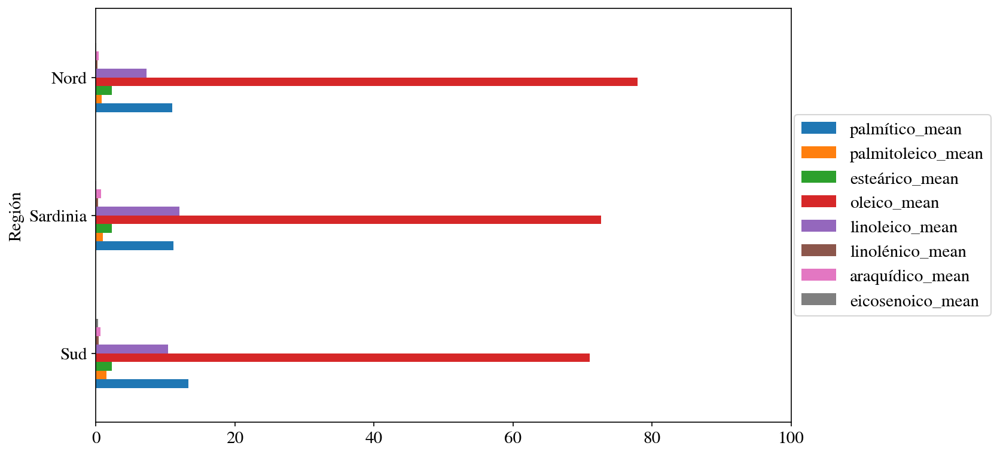

In [221]:
data_mean["Región"] = dict_region.values()
ax = data_mean.plot(kind="barh", x="Región")

# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right', bbox_to_anchor=(1.3, 0.5))
ax.set_xlim([0,100])

Hemos representado las proporciones de ácidos grasos en cada región. Representaremos ahora para cada ácido graso, su distribución por regiones. Para ello, en primer lugar podemos dividir una figura en tantas subfiguras como ácidos grasos, mediante la función `subplots()`. Un bucle nos permitirá recorrer cada una de las subfiguras, y en cada una de ellas representaremos tres gráficos, cada uno de ellos mostrando el histograma del correspondiente ácido graso en una de las tres regiones.

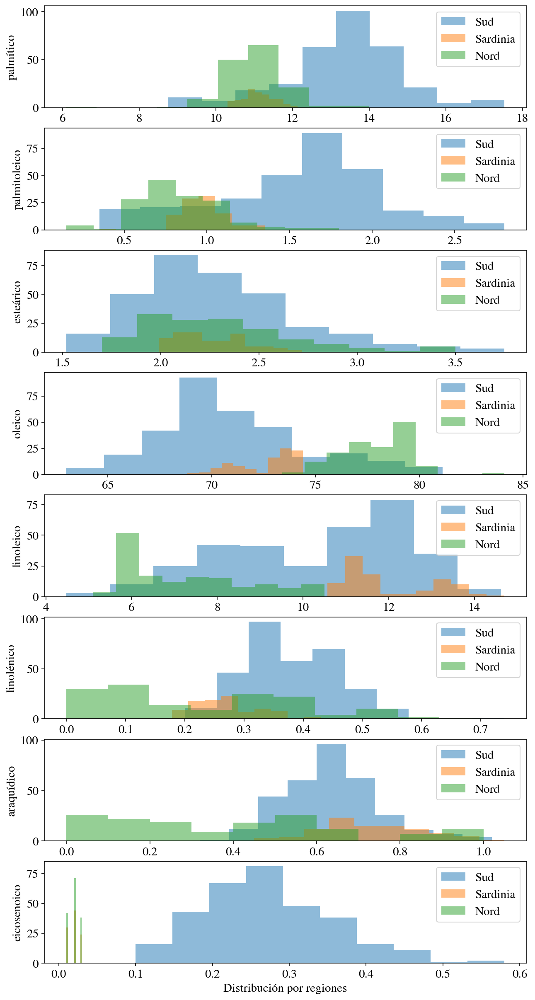

In [261]:
data["Región"] = data["región"].replace([1, 2, 3], dict_region.values())

acids = data.columns[3:-1]
fig, axes = plt.subplots(figsize=(10, 20), nrows=len(acids), ncols=1)

for idx,acid in enumerate(acids):
    for region in dict_region.values():
        ax = axes[idx]
        data_hist = data.loc[data["Región"] == region, acid]
        ax.set_ylabel(acid)
        ax.hist(data_hist, alpha=.5, label=region)
    ax.legend()
ax.set_xlabel("Distribución por regiones")
plt.show()

Podemos calcular la frecuencia relativa acumulada del ácido graso eicosenoico respecto a un valor determinado (p.ej. 0.05) como la fracción de valores menores a 0.05 respecto al total. Para ello, podemos obtener la serie de condiciones a partir de la columna del ácido graso eicosenoico, lo que nos devolverá una serie de valores de verdad `True` o `False`. Si luego sumamos mediante la función `np.sum()` los valores ciertos obtenemos el número total de valores menores que 0.05. A partir de ahí tenemos en cuenta el total de valores y obtenemos el valor deseado de la frecuencia relativa acumulada.

In [276]:
lim = .05
data_eicosenoico = data["eicosenoico"]
crf = np.sum(data_eicosenoico < lim)  / len(data_eicosenoico)
print(crf)

0.4353146853146853


Con pandas podemos indexar un objeto mediante una condición. Interpreta el siguiente código.

In [282]:
bajo = data[data['eicosenoico'] < 0.02]
pd.crosstab(bajo['área'], bajo['región'])

región,2,3
área,,
5,19,0
6,11,0
7,0,17
8,0,11
9,0,14


El código anterior representa una tabla de frecuencias de región y área. Muestra la cantidad de datos que hay por debajo de 0.02 para un área y región concretos.

Hemos visto en los porcentajes relativos que el ácido oleico domina a los demás, lo que dificulta el análisis del resto de ácidos grasos. Eliminaremos el ácido oleico y representaremos los demás de nuevo mediante un diagrama de barras. ¿Qué podemos decir respecto al ácido eicosenoico?

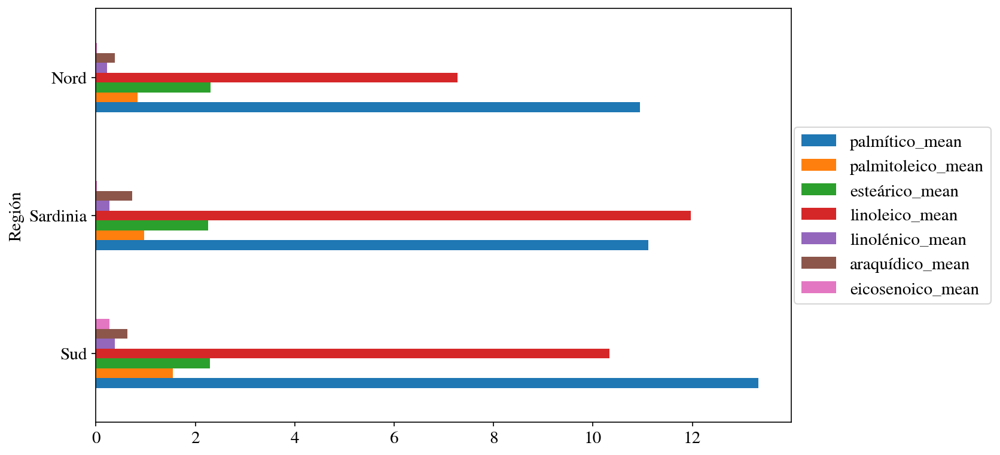

In [293]:
menos_oleico = ['palmítico', 'palmitoleico', 'esteárico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico']
for k,acid in enumerate(menos_oleico):
    menos_oleico[k] = f"{acid}_mean"
menos_oleico.append("Región")
ax = data_mean[menos_oleico].plot(kind="barh", x="Región")

# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right', bbox_to_anchor=(1.3, 0.5));

Representa tres gráficos, uno por cada región, con los diagramas de cajas para cada uno de los ácidos grasos, menos el oleico. ¿Podemos decir algo respecto al ácido linoleico?

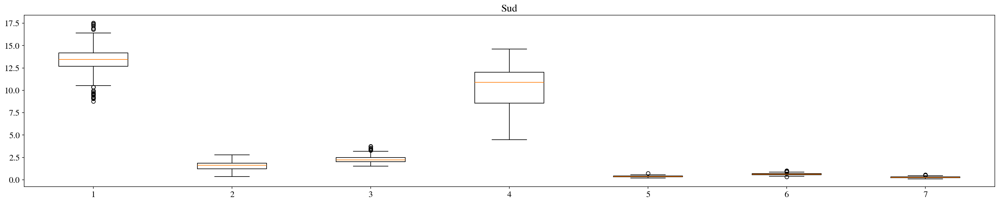

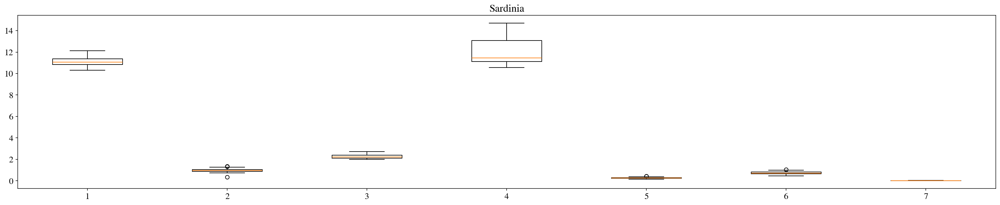

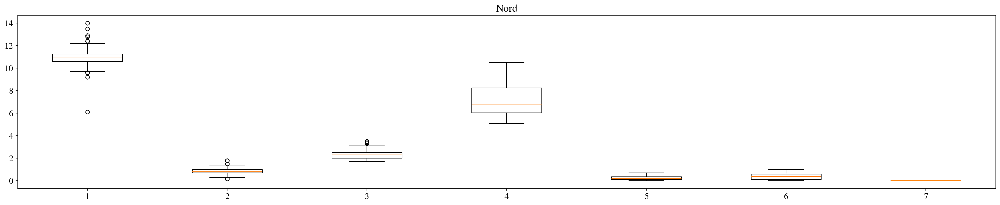

In [309]:
for idx,acid in enumerate(menos_oleico):
    menos_oleico[idx] = acid.replace("_mean", "")

for clave, group in data.groupby('región'):
    plt.figure(figsize=(28, 5))
    plt.boxplot(group[menos_oleico[:-1]])
    plt.title(dict_region[clave])



Representa un diagrama de coordenadas paralelas para los distintos ácidos grasos, mediante la función `parallel_coordinates()`. Puede ser útil normalizar los datos para que la media sea cero. Juega con distintos valores del parámetro `alpha` para poder distinguir mejor los distintos haces de valores.

<Axes: >

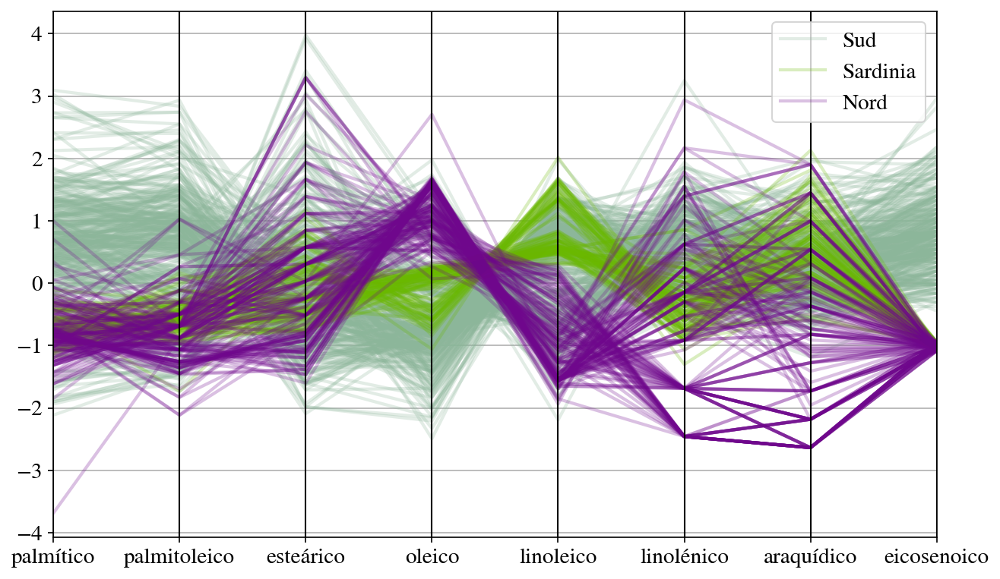

In [329]:
from pandas.plotting import parallel_coordinates
acids = data.columns[3:-1]

normalize = lambda x: (x - x.mean()) / x.std()
data_normalized = data[acids].apply(normalize)
data_normalized["Región"] = data["Región"]
parallel_coordinates(data_normalized, "Región", alpha=.25)

Representa un diagrama de dispersión del ácido linoleico frente al araquídico, diferenciando las tres regiones. Este gráfico es útil cuando queremos enfatizar un aspecto visual de los datos en una justificación. ¿Qué podemos decir respecto a la separabilidad de las distintas regiones? 

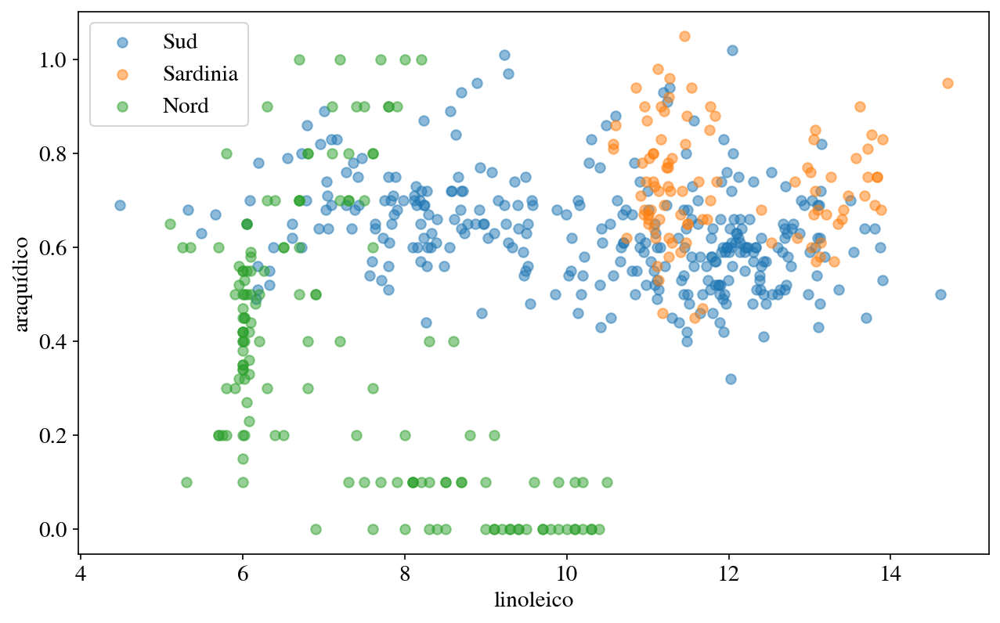

In [345]:
for region in dict_region.values():
    data_plot = data.loc[data["Región"] == region]
    plt.scatter(x=data_plot["linoleico"], y=data_plot["araquídico"], alpha=.5, label=region)
plt.xlabel("linoleico")
plt.ylabel("araquídico")
plt.legend()

Representa mediante diagramas de dispersión los distintos ácidos grasos dos a dos. No es necesario permutar los parámetros en la representación. Indaga sobre la separabilidad observada.

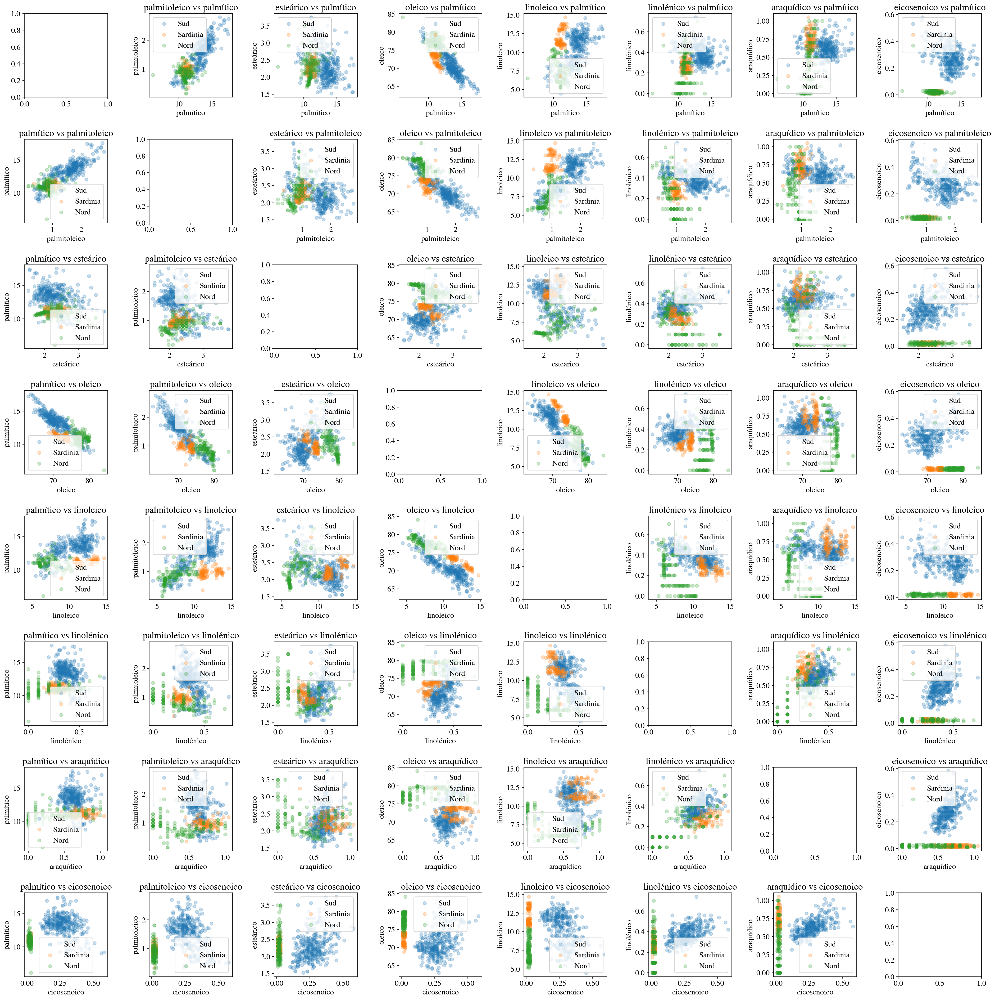

In [375]:
acids = data.columns[3:-1]
n_acids = len(acids)

fig, axes = plt.subplots(figsize=(25,25), nrows=n_acids, ncols=n_acids)
fig.tight_layout()
fig.subplots_adjust(hspace=.5, wspace=.5)
for i,acid_i in enumerate(acids):
    for j,acid_j in enumerate(acids):
        if i != j:
            ax = axes[i,j]
            for region in dict_region.values():
                data_plot = data.loc[data["Región"] == region]
                ax.scatter(data_plot[acid_i], data_plot[acid_j], alpha=.25, label=region)
            ax.legend()
            ax.set_xlabel(acid_i)
            ax.set_ylabel(acid_j)
            ax.set_title(f"{acid_j} vs {acid_i}")

Hasta aquí hemos realizado un análisis de los distintos aceites según su región de procedencia. Podríamos extender el trabajo a las distintas áreas de procedencia, analizando igualmente la separabilidad. ¿Qué podríamos concluir?

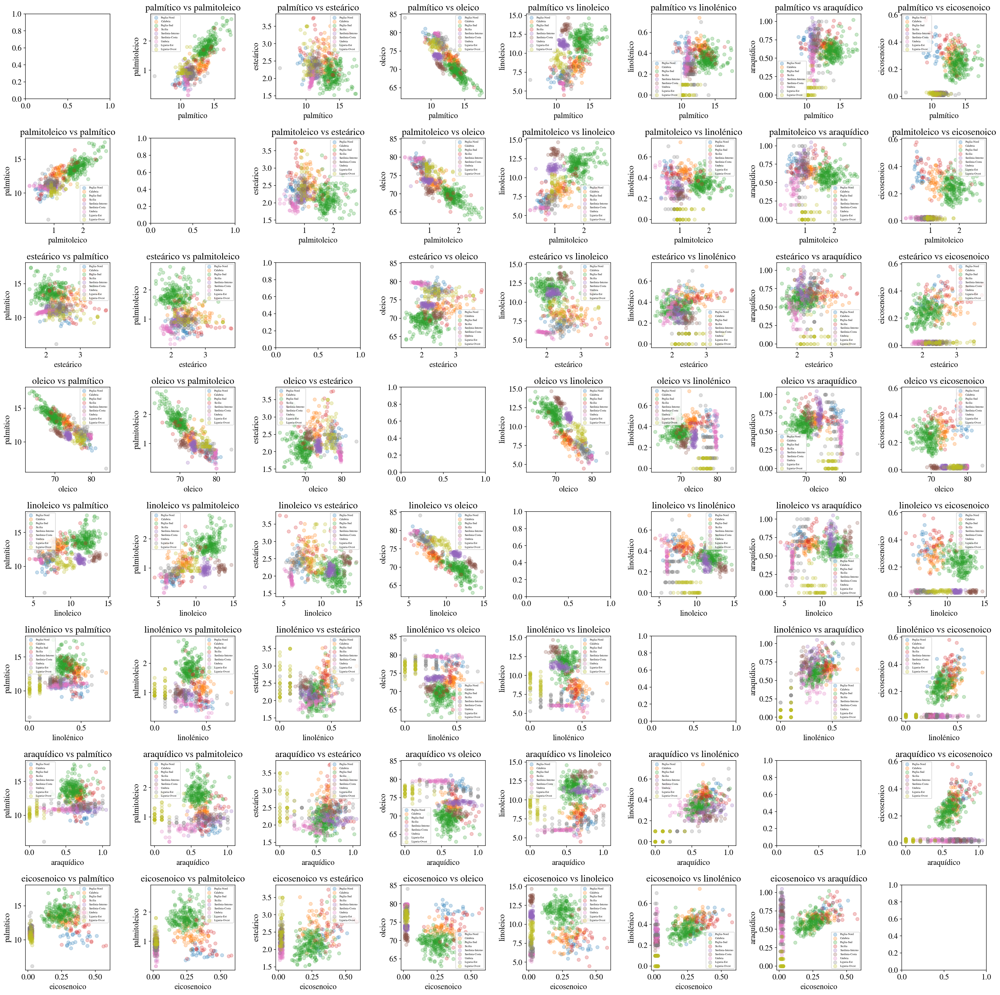